# Обучение модели [YOLOv5](https://github.com/ultralytics/yolov5/) на датасете c фотографиями с мусором [TACO](http://tacodataset.org/)

### Описание:
Проект выполнялся как итоговый проект Deep Learning School (DLS) advanced part 1.
В ноутбуке обучается модель YOLOv5 на датасете с фотографиями мусора TACO для дальнейшего использования в приложении / сайте / телеграм боте.

### Структура проекта:
* [Подключение необходимых библиотек](#libs)
* [Подготовка датасета](#dataset)
* [Обучение модели YOLOv5](#model)
* [Оценка модели на тестовой выборке](#test)
* [Вывод](#conclusion)

<a id="libs"></a>
## Подключение необходимых библиотек

In [1]:
import os
import shutil
import glob
import numpy as np
import pandas as pd
import tqdm
import splitfolders
from pycocotools.coco import COCO
from IPython.display import Image, display

In [2]:
v = !python --version
print('python version: {}'.format(v))
print('numpy version: {}'.format(np.__version__))
print('pandas version: {}'.format(pd.__version__))
print('tqdm version: {}'.format(tqdm.__version__))
print('splitfolders version: {}'.format(splitfolders.__version__))

python version: ['Python 3.9.7']
numpy version: 1.21.2
pandas version: 1.3.4
tqdm version: 4.62.3
splitfolders version: 0.5.1


#### Клонирование репозитория с актуальной версией YOLOv5

In [3]:
!git clone https://github.com/ultralytics/yolov5

fatal: destination path 'yolov5' already exists and is not an empty directory.


<a id="dataset"></a>
## Подготовка датасета

In [4]:
data_source = COCO(annotation_file='./data/annotations.json')

loading annotations into memory...
Done (t=0.05s)
creating index...
index created!


In [5]:
data_source.info()

year: 2019
version: None
description: TACO
contributor: None
url: None
date_created: 2019-12-19T16:11:15.258399+00:00


In [6]:
# remapping label id to start from 0
label_transfer = {5: 0, 12: 1}

img_ids = data_source.getImgIds()

catIds = data_source.getCatIds()
categories = data_source.loadCats(catIds)
categories.sort(key=lambda x: x['id'])
classes = {}
coco_labels = {}
coco_labels_inverse = {}
for c in categories:
    coco_labels[len(classes)] = c['id']
    coco_labels_inverse[c['id']] = len(classes)
    classes[c['name']] = len(classes)

class_num = {}

In [7]:
categories

[{'supercategory': 'Aluminium foil', 'id': 0, 'name': 'Aluminium foil'},
 {'supercategory': 'Battery', 'id': 1, 'name': 'Battery'},
 {'supercategory': 'Blister pack', 'id': 2, 'name': 'Aluminium blister pack'},
 {'supercategory': 'Blister pack', 'id': 3, 'name': 'Carded blister pack'},
 {'supercategory': 'Bottle', 'id': 4, 'name': 'Other plastic bottle'},
 {'supercategory': 'Bottle', 'id': 5, 'name': 'Clear plastic bottle'},
 {'supercategory': 'Bottle', 'id': 6, 'name': 'Glass bottle'},
 {'supercategory': 'Bottle cap', 'id': 7, 'name': 'Plastic bottle cap'},
 {'supercategory': 'Bottle cap', 'id': 8, 'name': 'Metal bottle cap'},
 {'supercategory': 'Broken glass', 'id': 9, 'name': 'Broken glass'},
 {'supercategory': 'Can', 'id': 10, 'name': 'Food Can'},
 {'supercategory': 'Can', 'id': 11, 'name': 'Aerosol'},
 {'supercategory': 'Can', 'id': 12, 'name': 'Drink can'},
 {'supercategory': 'Carton', 'id': 13, 'name': 'Toilet tube'},
 {'supercategory': 'Carton', 'id': 14, 'name': 'Other carton'

Выбрана только часть категорий, для бОльших возможностей модели можно добавить категории и дообучить модель.

#### Подготовка аннотаций

In [8]:
%cd yolov5

/home/sergzemsk/dls/yolov5


In [9]:
!mkdir -p tmp/labels tmp/images
save_base_path  = 'tmp/labels/'
save_image_path = 'tmp/images/'

In [10]:
for index, img_id in tqdm.tqdm(enumerate(img_ids), desc='change .json file to .txt file'):
    img_info = data_source.loadImgs(img_id)[0]
    save_name = img_info['file_name'].replace('/', '_')
    file_name = save_name.split('.')[0]
    height = img_info['height']
    width = img_info['width']
    save_path = save_base_path + file_name + '.txt'
    is_exist = False
    with open(save_path, mode='w') as fp:
        annotation_id = data_source.getAnnIds(img_id)
        boxes = np.zeros((0, 5))
        if len(annotation_id) == 0:
            fp.write('')
            continue
        annotations = data_source.loadAnns(annotation_id)
        lines = ''
        for annotation in annotations:
            label = coco_labels_inverse[annotation['category_id']]
            if label in label_transfer.keys():
                is_exist = True
                box = annotation['bbox']
                if box[2] < 1 or box[3] < 1:
                    continue
                # top_x,top_y,width,height==>cen_x,cen_y,width,height
                box[0] = round((box[0] + box[2] / 2) / width, 6)
                box[1] = round((box[1] + box[3] / 2) / height, 6)
                box[2] = round(box[2] / width, 6)
                box[3] = round(box[3] / height, 6)
                label = label_transfer[label]
                if label not in class_num.keys():
                    class_num[label] = 0
                class_num[label] += 1
                lines = lines + str(label)
                for i in box:
                    lines += ' ' + str(i)
                lines += '\n'
        fp.writelines(lines)
    if is_exist:
        shutil.copy('../data/{}'.format(img_info['file_name']), os.path.join(save_image_path, save_name))
    else:
        os.remove(save_path)

change .json file to .txt file: 1500it [00:01, 1338.35it/s]


<a id="model"></a>
## Обучение модели YOLOv5

#### Деление на тренировочную, валидационную и тестовую выборки

In [11]:
splitfolders.ratio('tmp', output="taco", seed=42, ratio=(.84, 0.11, 0.05)) 

Copying files: 708 files [00:01, 698.04 files/s] 


Датасет для тестирования модели

In [12]:
!ls taco/test/images

batch_10_000035.jpg  batch_12_000094.jpg   batch_5_000052.JPG
batch_10_000081.jpg  batch_13_000027.jpg   batch_5_000070.JPG
batch_10_000087.jpg  batch_13_000036.jpg   batch_5_000103.JPG
batch_1_000014.jpg   batch_13_000088.jpg   batch_6_000006.JPG
batch_1_000019.jpg   batch_13_000095.jpg   batch_6_000066.JPG
batch_1_000025.jpg   batch_15_000062.jpg   batch_6_000100.JPG
batch_1_000031.jpg   batch_2_000018.JPG    batch_7_000010.JPG
batch_1_000062.JPG   batch_2_000019.JPG    batch_7_000080.JPG
batch_1_000110.JPG   batch_2_000048.JPG    batch_8_000011.jpg
batch_12_000012.jpg  batch_2_000049.JPG    batch_8_000013.jpg
batch_12_000059.jpg  batch_3_IMG_4932.JPG  batch_8_000020.jpg
batch_12_000079.jpg  batch_3_IMG_5053.JPG  batch_8_000074.jpg


#### Обучение модели YOLOv5

Используемая GPU

In [13]:
!nvidia-smi

Mon Feb 14 09:27:12 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.39       Driver Version: 460.39       CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  A100-SXM-80GB       Off  | 00000000:8B:00.0 Off |                    0 |
| N/A   28C    P0    51W / 500W |      4MiB / 81251MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Параметры обучения YOLOv5

In [14]:
CONFIG_FILE = '../taco2.yaml'
IMG_SIZE = 640
BATCH_SIZE = 320
EPOCHS = 5000
CFG = 'models/yolov5s.yaml' # Методы аугментации
WEIGHTS = 'yolov5s'

Большой объём видеопамяти позволяет использовать большой размер батча. Модель yolov5s выбрана для более быстрого инференса, так как для инференса будет использован CPU.

In [15]:
!python train.py --img {IMG_SIZE} --batch {BATCH_SIZE} --epochs {EPOCHS} --data {CONFIG_FILE} --cfg {CFG} --weights {WEIGHTS} --patience 500 --cache

train: weights=yolov5s, cfg=models/yolov5s.yaml, data=../taco2.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=5000, batch_size=320, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=500, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-253-ga45e472 torch 1.10.1 CUDA:0 (A100-SXM-80GB, 81251MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, transla

    8/4999     66.2G    0.1031   0.02322   0.02777        59       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134   0.000228     0.0746   0.000288   6.84e-05

     Epoch   gpu_mem       box       obj       cls    labels  img_size
    9/4999     66.2G     0.104   0.02147   0.02714        48       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134   0.000228     0.0746   0.000169   4.47e-05

     Epoch   gpu_mem       box       obj       cls    labels  img_size
   10/4999     66.2G    0.1029   0.02393   0.02757        58       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134   0.000205     0.0672   0.000265    6.3e-05

     Epoch   gpu_mem       box       obj       cls    labels  img_size
   11/4999     66.2G   0.09888   0.02


     Epoch   gpu_mem       box       obj       cls    labels  img_size
   34/4999     66.2G   0.09624   0.02355   0.02675        43       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134   0.000228     0.0746    0.00017    4.3e-05

     Epoch   gpu_mem       box       obj       cls    labels  img_size
   35/4999     66.2G   0.09665   0.02409   0.02547        53       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134   0.000205     0.0672   0.000145   3.24e-05

     Epoch   gpu_mem       box       obj       cls    labels  img_size
   36/4999     66.2G   0.09634   0.02757   0.02588        69       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134   0.000251     0.0821   0.000173   4.82e-05

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134   0.000228     0.0746   0.000148   3.73e-05

     Epoch   gpu_mem       box       obj       cls    labels  img_size
   60/4999     66.2G   0.09663   0.02316   0.02471        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134   0.000228     0.0746   0.000148   4.08e-05

     Epoch   gpu_mem       box       obj       cls    labels  img_size
   61/4999     66.2G   0.09324   0.02516   0.02575        56       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134   0.000137     0.0448   9.45e-05   2.64e-05

     Epoch   gpu_mem       box       obj       cls    labels  img_size
   62/4999     66.2G   0.09428   0.02639   0.02611        55       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
   85/4999     66.2G   0.08812   0.02529   0.02589        55       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.031     0.0522      0.012    0.00281

     Epoch   gpu_mem       box       obj       cls    labels  img_size
   86/4999     66.2G    0.0889   0.02435   0.02473        47       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134     0.0193     0.0448     0.0119    0.00405

     Epoch   gpu_mem       box       obj       cls    labels  img_size
   87/4999     66.2G   0.09434   0.02378   0.02418        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134     0.0265     0.0373     0.0127    0.00365

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134     0.0282      0.209     0.0172    0.00475

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  111/4999     66.2G   0.08181    0.0231   0.02195        49       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134     0.0667     0.0373     0.0118    0.00199

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  112/4999     66.2G   0.08383   0.02157   0.02248        39       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.536     0.0373     0.0125    0.00228

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  113/4999     66.2G   0.09134   0.02445   0.02166        69       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  136/4999     66.2G   0.07909   0.02451   0.02097        59       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134     0.0149     0.0969    0.00364   0.000873

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  137/4999     66.2G   0.07671   0.02633   0.02253        55       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.581     0.0448     0.0272    0.00674

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  138/4999     66.2G   0.08127   0.02412   0.01993        48       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.533     0.0746     0.0101    0.00191

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.583      0.127     0.0729     0.0211

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  162/4999     66.2G   0.07313   0.02371   0.02122        53       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.159      0.157     0.0819     0.0143

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  163/4999     66.2G   0.07797   0.02272   0.02034        51       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.62      0.097     0.0666     0.0087

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  164/4999     66.2G   0.08139   0.02136   0.02037        51       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  187/4999     66.2G   0.07386   0.02295   0.01835        49       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134    0.00735      0.313    0.00285    0.00068

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  188/4999     66.2G   0.07546   0.02406   0.01892        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134    0.00295      0.112     0.0011   0.000282

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  189/4999     66.2G   0.07928    0.0232     0.018        60       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134    0.00597     0.0672    0.00195   0.000481

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134     0.0875      0.351     0.0803     0.0244

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  213/4999     66.2G   0.07061   0.02248   0.01591        53       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.156      0.179      0.105     0.0289

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  214/4999     66.2G   0.06921   0.02127   0.01465        47       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.101      0.119     0.0345     0.0112

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  215/4999     66.2G   0.07227   0.02144   0.01451        50       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  238/4999     66.2G   0.07037   0.02209    0.0148        51       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.153      0.127     0.0677     0.0145

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  239/4999     66.2G   0.06872   0.02241   0.01443        65       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.196      0.179     0.0957     0.0313

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  240/4999     66.2G   0.07304   0.02169   0.01409        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.107      0.112     0.0355    0.00549

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.178      0.239      0.116     0.0346

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  264/4999     66.2G   0.06793   0.02218   0.01254        64       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.18      0.261      0.117     0.0329

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  265/4999     66.2G   0.06563   0.02158   0.01449        53       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.183      0.358      0.178     0.0527

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  266/4999     66.2G   0.06513   0.02058   0.01121        56       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  289/4999     66.2G   0.06283   0.02451   0.01018        72       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.24      0.313      0.187     0.0669

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  290/4999     66.2G   0.06302   0.02123  0.008558        65       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.141      0.254     0.0944     0.0317

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  291/4999     66.2G   0.06458   0.02093  0.008974        61       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.353      0.306      0.254     0.0696

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.252      0.343      0.163     0.0458

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  315/4999     66.2G   0.06072   0.02138  0.008355        54       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.26      0.231      0.178     0.0522

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  316/4999     66.2G   0.06044    0.0211  0.006829        60       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.418      0.395      0.247     0.0879

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  317/4999     66.2G   0.05991   0.01904  0.007043        49       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  340/4999     66.2G   0.06203   0.02095  0.006775        65       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.361      0.343      0.225     0.0533

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  341/4999     66.2G   0.06308   0.01756  0.005688        50       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.237      0.365      0.174     0.0418

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  342/4999     66.2G    0.0597     0.022  0.008139        72       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.344      0.381      0.281     0.0949

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.264      0.291      0.177     0.0543

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  366/4999     66.2G   0.05829   0.01632  0.004569        50       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.42      0.433      0.317      0.108

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  367/4999     66.2G   0.06375    0.0194   0.00504        70       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.374       0.38      0.271     0.0837

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  368/4999     66.2G   0.05651    0.0204  0.004012        76       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  391/4999     66.2G   0.05614    0.0172  0.005838        61       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.264      0.396      0.185      0.074

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  392/4999     66.2G   0.05305   0.01771  0.004734        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.416      0.381      0.277      0.116

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  393/4999     66.2G   0.05162   0.01961  0.005993        67       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.36      0.276      0.232      0.105

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.407      0.395      0.307      0.106

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  417/4999     66.2G   0.04992   0.01673  0.003761        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.556       0.44       0.42       0.15

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  418/4999     66.2G   0.05617   0.01674  0.003226        61       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.62      0.485      0.528      0.181

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  419/4999     66.2G   0.05584   0.01842  0.003771        72       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  442/4999     66.2G   0.04916   0.01864  0.002373        68       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.631      0.477       0.53      0.184

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  443/4999     66.2G   0.04997   0.01413  0.003827        45       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.535      0.604      0.574      0.264

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  444/4999     66.2G   0.05398   0.01449  0.003675        44       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.577      0.545      0.551      0.167

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.727      0.482      0.568      0.289

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  468/4999     66.2G   0.04892   0.01537  0.003076        61       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.678      0.625      0.669      0.273

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  469/4999     66.2G   0.04645   0.01633  0.002243        58       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.673      0.612      0.656       0.24

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  470/4999     66.2G    0.0538   0.01487  0.002657        69       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  493/4999     66.2G   0.05122   0.01703  0.003416        68       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.662      0.664      0.679      0.262

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  494/4999     66.2G   0.04843   0.01613  0.002888        61       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.763      0.589      0.669      0.291

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  495/4999     66.2G   0.04544   0.01598  0.003104        58       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.878      0.671      0.758      0.366

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.668      0.609      0.605      0.224

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  519/4999     66.2G   0.04685   0.01448  0.003469        63       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.773      0.567      0.654      0.328

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  520/4999     66.2G   0.04109   0.01304  0.003614        39       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.711       0.56      0.626        0.3

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  521/4999     66.2G   0.04468    0.0143  0.003031        58       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  544/4999     66.2G   0.04121   0.01337  0.003071        48       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.81      0.724      0.791      0.407

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  545/4999     66.2G   0.04154   0.01295  0.002364        70       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.889      0.746      0.824      0.405

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  546/4999     66.2G   0.04166   0.01142   0.00337        40       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.823      0.716      0.809      0.413

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.832      0.805      0.836      0.478

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  570/4999     66.2G   0.04044   0.01389  0.001669        63       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.795      0.791      0.823      0.468

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  571/4999     66.2G   0.03903   0.01242  0.002724        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.789      0.694      0.774      0.352

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  572/4999     66.2G   0.04047   0.01139  0.002626        39       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  595/4999     66.2G   0.03933   0.01399  0.002079        61       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.896      0.798      0.863      0.496

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  596/4999     66.2G   0.04461   0.01444  0.002049        86       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.932      0.738      0.861      0.484

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  597/4999     66.2G   0.04203    0.0158  0.001739        78       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.872       0.77      0.839      0.514

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.962      0.791      0.887      0.552

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  621/4999     66.2G   0.04347   0.01351  0.002363        74       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.955      0.809      0.886      0.534

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  622/4999     66.2G   0.03607   0.01058  0.003163        37       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.974      0.826        0.9       0.57

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  623/4999     66.2G   0.03275   0.01216  0.001846        54       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  646/4999     66.2G   0.03556   0.01066   0.00153        39       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.953      0.821      0.887      0.587

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  647/4999     66.2G   0.03391   0.01299  0.001912        76       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.932      0.851      0.895      0.516

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  648/4999     66.2G   0.03537    0.0108  0.001577        45       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.937      0.821      0.886      0.573

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.97      0.806      0.907      0.611

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  672/4999     66.2G   0.03255   0.01354  0.001833        77       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.926       0.82      0.919      0.636

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  673/4999     66.2G   0.03121   0.01095  0.002343        50       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.928       0.85      0.908      0.624

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  674/4999     66.2G   0.03429   0.01136  0.002746        62       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  697/4999     66.2G   0.03702    0.0126  0.002458        74       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.974      0.834      0.908      0.511

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  698/4999     66.2G   0.03685   0.01103 0.0008619        53       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.973      0.827      0.903      0.573

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  699/4999     66.2G   0.03979   0.01149  0.002242        50       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.949      0.828      0.906       0.57

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.849      0.881      0.887      0.578

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  723/4999     66.2G   0.03335    0.0136  0.001884        77       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.878      0.862      0.899      0.609

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  724/4999     66.2G   0.03406   0.01245  0.001847        75       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.895      0.835      0.908      0.559

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  725/4999     66.2G   0.03451    0.0127  0.001355        66       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  748/4999     66.2G   0.03391   0.01001   0.00131        47       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.96      0.873      0.921      0.622

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  749/4999     66.2G   0.03656   0.01442 0.0009706        94       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.918      0.881      0.922      0.598

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  750/4999     66.2G   0.03564   0.01307  0.001419        82       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.96      0.836      0.926       0.69

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.935      0.858      0.922      0.575

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  774/4999     66.2G    0.0347   0.01214  0.001432        56       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.974      0.848      0.924      0.634

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  775/4999     66.2G   0.03466   0.01179  0.001072        68       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.971       0.85      0.926       0.59

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  776/4999     66.2G   0.03348   0.01118  0.001492        62       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  799/4999     66.2G   0.03253   0.01064  0.002136        62       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.977      0.858      0.924       0.67

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  800/4999     66.2G   0.03292   0.01255  0.001137        81       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.977      0.873      0.932      0.658

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  801/4999     66.2G   0.03371   0.01127  0.001581        66       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.902      0.874      0.923      0.624

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.898      0.908      0.927      0.647

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  825/4999     66.2G   0.02966   0.01083  0.001076        59       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.896       0.89      0.911      0.623

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  826/4999     66.2G   0.03056   0.01159  0.001128        78       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.919      0.901      0.916      0.645

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  827/4999     66.2G   0.03019  0.009791  0.001328        45       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  850/4999     66.2G   0.03051   0.01117  0.001247        50       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.974      0.843      0.922      0.646

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  851/4999     66.2G   0.03209  0.009389  0.001435        41       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.987      0.836      0.927      0.643

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  852/4999     66.2G   0.03565  0.009067  0.002664        41       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.931      0.858      0.922      0.626

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.956      0.888      0.933      0.673

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  876/4999     66.2G   0.03154   0.01131  0.001509        71       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.975      0.852      0.929      0.664

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  877/4999     66.2G   0.02789  0.009383  0.002566        58       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.975      0.864      0.937      0.667

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  878/4999     66.2G   0.02994   0.01059  0.002033        64       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  901/4999     66.2G   0.03313   0.01167   0.00188        85       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.896      0.946      0.692

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  902/4999     66.2G   0.03245   0.01109  0.001368        72       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.982      0.903      0.944       0.68

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  903/4999     66.2G   0.03464   0.01117  0.001075        62       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.903      0.943      0.685

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.92      0.896       0.94      0.673

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  927/4999     66.2G   0.03213  0.008922 0.0008329        40       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.959      0.869      0.935       0.68

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  928/4999     66.2G   0.02948  0.009575 0.0008076        56       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.987      0.858      0.939      0.681

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  929/4999     66.2G   0.02908    0.0098  0.001775        46       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  952/4999     66.2G   0.02941   0.01076  0.001189        59       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.981      0.903      0.948      0.711

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  953/4999     66.2G   0.03015  0.009712 0.0008221        48       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.969      0.926      0.945      0.666

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  954/4999     66.2G    0.0286  0.009897 0.0007614        62       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.962      0.917      0.943       0.69

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.968      0.883      0.939      0.702

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  978/4999     66.2G   0.03071   0.01012  0.001112        69       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.951      0.868      0.923      0.676

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  979/4999     66.2G    0.0292  0.008221   0.00131        43       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.924      0.918       0.94      0.702

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  980/4999     66.2G   0.03005    0.0106  0.001768        60       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1003/4999     66.2G   0.02966  0.009008  0.000972        60       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.962      0.881      0.941        0.7

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1004/4999     66.2G   0.03276  0.009136  0.001138        56       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.928      0.866      0.924      0.603

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1005/4999     66.2G   0.03242    0.0102  0.001179        69       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.902      0.866      0.921      0.622

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.983      0.909      0.944      0.707

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1029/4999     66.2G   0.02841  0.008367   0.00115        40       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.921      0.947      0.684

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1030/4999     66.2G   0.02942  0.008566 0.0008437        47       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.915      0.948      0.724

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1031/4999     66.2G   0.02707   0.00963 0.0007471        68       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1054/4999     66.2G   0.02939   0.01046 0.0007682        66       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.964       0.91      0.935      0.708

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1055/4999     66.2G   0.02923  0.008861 0.0008182        51       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.976       0.91      0.944      0.699

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1056/4999     66.2G   0.02899   0.01009 0.0009464        58       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.966      0.918      0.944      0.711

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.896      0.932      0.682

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1080/4999     66.2G   0.03074  0.009755 0.0009604        69       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.977      0.903      0.935      0.729

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1081/4999     66.2G   0.02929  0.009342  0.001101        56       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.981       0.91       0.94      0.719

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1082/4999     66.2G   0.02736  0.009014  0.001288        57       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1105/4999     66.2G   0.02855  0.009868  0.001094        70       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.907      0.941      0.683

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1106/4999     66.2G   0.03314    0.0108  0.001563        77       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.976      0.909      0.935      0.709

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1107/4999     66.2G   0.02831  0.008527 0.0005167        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.968      0.917      0.936      0.716

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.979      0.896      0.941      0.731

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1131/4999     66.2G   0.02838  0.009168 0.0008149        66       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.958      0.896      0.933      0.723

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1132/4999     66.2G   0.02608  0.008328  0.001047        46       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.892      0.945      0.721

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1133/4999     66.2G   0.02701   0.00983  0.001332        69       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1156/4999     66.2G   0.02611  0.009549  0.001131        73       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.956      0.901      0.928      0.714

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1157/4999     66.2G   0.02823  0.008482  0.001294        48       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.966       0.91      0.932      0.716

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1158/4999     66.2G   0.02818   0.00952  0.001343        57       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.962       0.91      0.935      0.726

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.93      0.888      0.921      0.706

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1182/4999     66.2G    0.0266  0.009726  0.001128        54       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.966      0.895      0.927      0.728

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1183/4999     66.2G   0.02543  0.008977 0.0008348        67       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.978      0.903       0.93      0.733

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1184/4999     66.2G   0.02669  0.008686 0.0009837        50       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1207/4999     66.2G   0.02725  0.008512 0.0009163        60       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.989      0.895       0.93      0.741

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1208/4999     66.2G   0.02455  0.008647  0.000965        49       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.969      0.903      0.931      0.741

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1209/4999     66.2G   0.02517  0.008397 0.0007857        53       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.966      0.917      0.932      0.735

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.976      0.912      0.931      0.733

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1233/4999     66.2G   0.02602  0.008459  0.001356        60       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.965      0.918      0.935      0.745

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1234/4999     66.2G    0.0289  0.009756  0.003606        66       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.976      0.918      0.941      0.763

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1235/4999     66.2G   0.02528  0.008094  0.002544        52       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1258/4999     66.2G   0.02592  0.009708  0.001053        71       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.97       0.92      0.947      0.749

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1259/4999     66.2G   0.02628  0.009511  0.001177        73       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.918       0.95      0.759

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1260/4999     66.2G   0.02456  0.007061 0.0008431        46       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.954      0.928      0.948      0.739

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.966      0.903      0.935      0.733

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1284/4999     66.2G   0.02755  0.009597 0.0009062        59       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.958      0.918      0.935      0.744

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1285/4999     66.2G   0.02843  0.008139 0.0007704        38       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.891      0.934      0.731

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1286/4999     66.2G   0.02867    0.0108 0.0008671        84       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1309/4999     66.2G   0.02315  0.009186 0.0009538        66       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.965      0.918      0.941      0.764

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1310/4999     66.2G   0.02366  0.008405  0.001045        48       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.967      0.918      0.944      0.749

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1311/4999     66.2G   0.02747  0.009677   0.00139        88       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.972      0.918      0.944      0.763

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.908      0.942      0.759

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1335/4999     66.2G   0.02497  0.008595 0.0008567        53       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984       0.91       0.94      0.766

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1336/4999     66.2G   0.02719  0.009678  0.001097        70       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.917      0.947      0.734

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1337/4999     66.2G   0.02738  0.009126 0.0007247        67       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1360/4999     66.2G   0.02606  0.008578 0.0008669        61       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.981      0.895      0.939      0.779

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1361/4999     66.2G   0.02572  0.008929 0.0006916        50       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.961       0.91      0.934       0.77

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1362/4999     66.2G   0.02768  0.009635  0.001007        72       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.888      0.939      0.755

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.987      0.925      0.946      0.746

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1386/4999     66.2G   0.02706   0.00821  0.001028        47       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.922      0.945      0.766

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1387/4999     66.2G   0.02788   0.01018  0.001703        61       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.974      0.918      0.946      0.762

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1388/4999     66.2G   0.02909  0.009143 0.0006346        61       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1411/4999     66.2G   0.02341  0.007504 0.0008721        54       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.981      0.925      0.945       0.79

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1412/4999     66.2G   0.02661  0.008234 0.0009635        55       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.981      0.925      0.947      0.779

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1413/4999     66.2G   0.02362  0.008514 0.0006808        68       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.982      0.925      0.946      0.779

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.983      0.925      0.948      0.788

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1437/4999     66.2G   0.02451  0.008793 0.0006264        60       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.983      0.925      0.947      0.755

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1438/4999     66.2G   0.02486  0.008082  0.001118        48       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.983      0.925      0.952      0.773

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1439/4999     66.2G    0.0251  0.008376 0.0005154        63       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1462/4999     66.2G   0.02584  0.009205 0.0005603        71       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.97      0.925      0.937      0.783

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1463/4999     66.2G   0.02397   0.00744 0.0007247        48       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.978      0.924      0.942      0.764

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1464/4999     66.2G   0.02619    0.0084 0.0007387        50       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.969       0.92      0.941      0.769

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.96       0.91      0.947      0.779

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1488/4999     66.2G   0.02424  0.007855 0.0007693        59       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.888      0.949      0.792

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1489/4999     66.2G   0.02475   0.00827  0.001464        48       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.998      0.881      0.948      0.779

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1490/4999     66.2G   0.02457   0.00856  0.001084        57       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1513/4999     66.2G   0.02385  0.008049 0.0009701        49       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.983      0.918      0.941      0.776

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1514/4999     66.2G   0.02406  0.007897 0.0008884        56       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.922       0.94      0.769

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1515/4999     66.2G   0.02533  0.008616  0.002356        69       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.913       0.94      0.778

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.925      0.945      0.776

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1539/4999     66.2G    0.0254  0.007909 0.0007115        53       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.925      0.944      0.766

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1540/4999     66.2G   0.02559   0.00915 0.0009213        65       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.942      0.771

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1541/4999     66.2G   0.02454  0.007188 0.0008521        53       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1564/4999     66.2G   0.02721  0.009009 0.0009368        69       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134          1      0.917      0.939      0.768

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1565/4999     66.2G   0.02479  0.008379  0.001147        54       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.932       0.94      0.773

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1566/4999     66.2G   0.02559  0.007978 0.0008335        54       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.978      0.928       0.94      0.768

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.969       0.92       0.94      0.782

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1590/4999     66.2G    0.0226  0.006953 0.0007711        43       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.969      0.919       0.94      0.792

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1591/4999     66.2G    0.0242  0.007997 0.0007873        57       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.968       0.91      0.941      0.778

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1592/4999     66.2G   0.02347  0.007733  0.001853        52       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1615/4999     66.2G   0.02656  0.008296 0.0008513        56       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992       0.91      0.942      0.768

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1616/4999     66.2G    0.0245  0.009259  0.001033        61       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.99       0.91      0.942       0.76

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1617/4999     66.2G   0.02238  0.009224 0.0007464        67       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.997       0.91      0.942      0.771

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.976      0.907      0.933      0.791

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1641/4999     66.2G   0.02402  0.007104 0.0009866        50       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.999      0.903      0.938      0.794

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1642/4999     66.2G    0.0245  0.007844  0.001134        53       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.998       0.91      0.939      0.787

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1643/4999     66.2G   0.02335  0.008649 0.0008696        70       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1666/4999     66.2G    0.0231  0.008614  0.001063        71       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.929      0.947      0.788

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1667/4999     66.2G    0.0263  0.008292 0.0009758        53       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.988      0.925      0.946      0.777

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1668/4999     66.2G   0.02383  0.008518  0.001208        58       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.977      0.918      0.945      0.787

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.976      0.907      0.943      0.776

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1692/4999     66.2G   0.02323  0.007741  0.002321        46       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.913      0.944      0.775

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1693/4999     66.2G   0.02034  0.007718  0.002017        61       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.977      0.903      0.934      0.791

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1694/4999     66.2G   0.02188  0.008969  0.001129        66       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1717/4999     66.2G   0.02354  0.007505 0.0006549        54       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.906      0.945      0.789

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1718/4999     66.2G    0.0224  0.007512 0.0009244        64       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.988      0.903      0.946      0.804

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1719/4999     66.2G   0.02248  0.007013 0.0005416        55       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.989      0.903      0.947      0.798

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992       0.91       0.95      0.806

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1743/4999     66.2G   0.02326  0.008061 0.0006426        67       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992       0.91       0.95      0.818

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1744/4999     66.2G   0.02093  0.007488 0.0006843        53       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.913       0.95      0.814

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1745/4999     66.2G    0.0218  0.008554 0.0006972        59       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1768/4999     66.2G    0.0208  0.007339 0.0006379        57       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.969      0.918       0.94      0.812

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1769/4999     66.2G   0.02168  0.006893 0.0006908        49       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.966      0.918      0.939       0.81

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1770/4999     66.2G   0.02352  0.008841  0.001006        60       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.974      0.918      0.942      0.814

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.974      0.925      0.941      0.803

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1794/4999     66.2G   0.02543  0.007773 0.0008149        59       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.961      0.932       0.94      0.799

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1795/4999     66.2G   0.02463  0.007335 0.0005182        45       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.981      0.918      0.947      0.799

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1796/4999     66.2G   0.02578   0.00933  0.001184        80       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1819/4999     66.2G   0.02379  0.008677 0.0009299        63       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.918      0.945      0.807

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1820/4999     66.2G   0.02313  0.007222 0.0004725        50       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.974      0.918      0.945      0.805

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1821/4999     66.2G   0.02243  0.007574  0.000517        59       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.983      0.918      0.945      0.815

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.969      0.923      0.945      0.806

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1845/4999     66.2G   0.02306  0.007827 0.0009505        55       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.973      0.918      0.942      0.801

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1846/4999     66.2G   0.02254  0.007563  0.001076        51       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.976      0.918      0.942      0.803

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1847/4999     66.2G   0.02171  0.008243  0.001007        76       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1870/4999     66.2G   0.02322  0.008479 0.0007953        76       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.987      0.925      0.946       0.82

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1871/4999     66.2G   0.02392  0.008214 0.0008163        76       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.987      0.925      0.949       0.82

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1872/4999     66.2G   0.02265  0.006954 0.0005467        44       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.918       0.95      0.809

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.921      0.944      0.816

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1896/4999     66.2G    0.0233  0.007926 0.0005754        67       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.979      0.925      0.944      0.809

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1897/4999     66.2G   0.02035  0.007142 0.0006111        56       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.977      0.925      0.944      0.819

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1898/4999     66.2G   0.02451  0.007538 0.0006005        52       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1921/4999     66.2G   0.02093  0.007735 0.0007823        62       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984       0.91      0.951      0.829

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1922/4999     66.2G   0.02094  0.008245 0.0007734        61       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.909      0.951      0.823

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1923/4999     66.2G   0.02222  0.009068  0.000648        88       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.973      0.918      0.951      0.832

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.965      0.933      0.955      0.827

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1947/4999     66.2G   0.02273  0.007789 0.0004078        62       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.967      0.925      0.953      0.818

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1948/4999     66.2G   0.02297  0.008168  0.000693        66       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.955      0.933      0.952      0.825

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1949/4999     66.2G   0.02254  0.007609 0.0004895        49       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1972/4999     66.2G   0.02259   0.00851 0.0009322        80       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.98      0.925      0.949      0.815

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1973/4999     66.2G   0.02123  0.007548  0.000649        58       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.973      0.925      0.948      0.819

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1974/4999     66.2G   0.02148  0.006326 0.0005931        42       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.971      0.918      0.947      0.808

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.981      0.918      0.939      0.813

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1998/4999     66.2G   0.02458  0.008169 0.0005895        70       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.914      0.945      0.818

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1999/4999     66.2G   0.02152  0.008355  0.001027        56       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.915      0.943      0.813

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2000/4999     66.2G   0.02178  0.006527 0.0008077        33       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2023/4999     66.2G   0.02302  0.008316  0.000596        69       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.976      0.918      0.949      0.816

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2024/4999     66.2G   0.02225  0.006878 0.0008675        48       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.983      0.918       0.95       0.82

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2025/4999     66.2G   0.01999  0.006043 0.0003432        37       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.983      0.918       0.95      0.815

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.982      0.925      0.948      0.831

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2049/4999     66.2G    0.0231  0.008366 0.0008683        85       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.923      0.948      0.824

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2050/4999     66.2G   0.02251  0.007427  0.000629        47       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.923      0.948      0.833

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2051/4999     66.2G   0.02177  0.006422 0.0004452        52       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2074/4999     66.2G   0.02187  0.007374 0.0005643        65       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.925      0.953      0.821

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2075/4999     66.2G   0.02241  0.007631  0.001164        57       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.933      0.952      0.821

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2076/4999     66.2G   0.02453  0.009481 0.0006952        75       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.928      0.951      0.818

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.918      0.947       0.83

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2100/4999     66.2G   0.02106  0.006664 0.0006636        47       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.98      0.925      0.946      0.824

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2101/4999     66.2G   0.02306  0.008168 0.0006726        77       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.993      0.918      0.946      0.828

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2102/4999     66.2G   0.02436    0.0089 0.0007266        87       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2125/4999     66.2G    0.0201  0.008594  0.001289        71       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.976      0.916      0.953      0.833

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2126/4999     66.2G   0.02101  0.007205  0.001282        51       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.973      0.918      0.953      0.834

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2127/4999     66.2G   0.01883  0.006088 0.0009283        46       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.973      0.918      0.953      0.835

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.928      0.952      0.832

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2151/4999     66.2G   0.02015  0.007214 0.0008119        57       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.918      0.951      0.822

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2152/4999     66.2G     0.022  0.007177 0.0006411        58       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.918       0.95      0.819

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2153/4999     66.2G   0.02055  0.007821 0.0006222        68       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2176/4999     66.2G   0.02208  0.006553 0.0004941        50       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.975      0.903      0.949      0.835

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2177/4999     66.2G   0.02073  0.007336 0.0006289        56       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.949      0.925      0.948      0.834

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2178/4999     66.2G   0.02024  0.007408 0.0004948        60       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.949      0.925      0.947      0.834

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.987      0.903      0.944      0.814

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2202/4999     66.2G   0.02065  0.007179 0.0008994        60       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.968      0.917      0.944      0.808

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2203/4999     66.2G   0.02162  0.008108  0.001067        71       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.98      0.918      0.944      0.811

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2204/4999     66.2G   0.02169  0.007313 0.0008173        61       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2227/4999     66.2G   0.01992  0.007936 0.0006606        73       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.987      0.918      0.951      0.827

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2228/4999     66.2G   0.02292  0.007754  0.001786        75       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.998      0.918      0.951      0.832

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2229/4999     66.2G   0.01864   0.00654  0.000654        56       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.998      0.918      0.951      0.836

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.912      0.944      0.827

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2253/4999     66.2G   0.01715  0.006671 0.0006639        62       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.987      0.918      0.944       0.82

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2254/4999     66.2G      0.02  0.006983 0.0008821        60       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.989      0.918      0.945      0.822

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2255/4999     66.2G   0.02007  0.007471 0.0006652        65       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2278/4999     66.2G   0.02071  0.007699  0.000645        76       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.918      0.943      0.827

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2279/4999     66.2G   0.01884  0.006975 0.0006853        60       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.983      0.918      0.944      0.826

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2280/4999     66.2G   0.02059  0.007184  0.001286        48       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.918      0.945      0.835

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.892      0.938      0.838

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2304/4999     66.2G   0.02114  0.007368 0.0006276        68       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.967      0.918      0.938      0.839

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2305/4999     66.2G   0.01919   0.00661 0.0007275        51       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.973      0.918      0.942      0.833

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2306/4999     66.2G   0.02047  0.006055 0.0006379        59       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2329/4999     66.2G   0.01922  0.006231  0.001107        43       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.979      0.925      0.948      0.838

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2330/4999     66.2G   0.01854    0.0068  0.001176        50       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.978      0.925      0.947      0.834

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2331/4999     66.2G   0.01863  0.006085  0.001039        53       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.977      0.925      0.946      0.834

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.989      0.925       0.95      0.834

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2355/4999     66.2G   0.02089   0.00783 0.0008962        70       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.989      0.925      0.951      0.841

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2356/4999     66.2G   0.01967  0.006173 0.0008465        45       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.931      0.951      0.843

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2357/4999     66.2G   0.02145  0.007939 0.0009476        65       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2380/4999     66.2G   0.02345  0.006812 0.0005801        48       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.917      0.941      0.817

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2381/4999     66.2G    0.0212  0.007962 0.0009784        75       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.915      0.948      0.828

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2382/4999     66.2G   0.01876  0.006251 0.0005864        44       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.914      0.941      0.825

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134          1      0.932      0.954      0.838

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2406/4999     66.2G   0.01911  0.006075 0.0004436        50       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134          1       0.93      0.955      0.842

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2407/4999     66.2G   0.02052   0.00886 0.0008014        88       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.996      0.925      0.955       0.84

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2408/4999     66.2G   0.01974  0.007401 0.0004131        62       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2431/4999     66.2G   0.01925  0.006167 0.0006318        42       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.976       0.93      0.954      0.853

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2432/4999     66.2G   0.02115  0.006405 0.0007192        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.976      0.929      0.954       0.85

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2433/4999     66.2G   0.01831  0.005915 0.0005575        43       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.976       0.93      0.955      0.851

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.99      0.925      0.947      0.844

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2457/4999     66.2G   0.01922  0.007245 0.0006379        68       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134          1      0.923      0.949      0.841

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2458/4999     66.2G   0.01997  0.006506 0.0005053        57       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.924      0.949      0.848

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2459/4999     66.2G   0.02175  0.007127 0.0005343        67       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2482/4999     66.2G   0.01896  0.007426  0.001068        60       640:  50%|███6.2G   0.01896  0.007426  0.001068        60       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.953       0.94       0.95       0.84

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2483/4999     66.2G   0.01962   0.00787  0.001287        64       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.983      0.918       0.95      0.837

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2484/4999     66.2G   0.01793  0.007094 0.0005658        63       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.982      0

 2507/4999     66.2G   0.02056  0.006561 0.0006392        50       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.98      0.925       0.95      0.849

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2508/4999     66.2G   0.02053  0.006407 0.0007229        51       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984       0.92      0.951      0.849

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2509/4999     66.2G   0.01811  0.006957 0.0006331        60       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.979      0.918      0.951      0.857

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2510/4999     66.2G    0.0173  0.006


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2533/4999     66.2G   0.01728  0.006573 0.0003865        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.924      0.951      0.857

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2534/4999     66.2G   0.01841   0.00722  0.000423        56       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.924      0.951      0.867

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2535/4999     66.2G   0.01801    0.0065 0.0003989        60       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.951       0.86

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.975       0.91      0.939      0.851

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2559/4999     66.2G   0.01849  0.005663  0.000553        47       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.982       0.91      0.939      0.854

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2560/4999     66.2G    0.0194  0.007523  0.000517        67       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.983       0.91       0.94      0.852

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2561/4999     66.2G   0.01913  0.006617 0.0006106        57       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2584/4999     66.2G   0.01755  0.006399  0.000521        54       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.918      0.951      0.846

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2585/4999     66.2G   0.01743  0.006149  0.001219        53       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.918      0.951      0.856

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2586/4999     66.2G   0.01645  0.005581 0.0004738        54       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.918      0.951      0.858

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.982      0.918      0.952      0.867

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2610/4999     66.2G   0.01907  0.006662 0.0009878        67       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.979      0.925       0.95      0.861

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2611/4999     66.2G    0.0187   0.00525 0.0006692        39       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.979      0.925       0.95      0.866

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2612/4999     66.2G    0.0186   0.00767 0.0006088        79       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2635/4999     66.2G   0.01779  0.006216  0.000621        46       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.981       0.91      0.944      0.848

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2636/4999     66.2G   0.01737  0.005885 0.0007596        40       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.982       0.91      0.944      0.848

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2637/4999     66.2G   0.01839   0.00533 0.0006216        39       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.979      0.918      0.944       0.85

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.978      0.937      0.955       0.85

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2661/4999     66.2G   0.01808  0.006183 0.0006255        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.938      0.955      0.852

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2662/4999     66.2G   0.01756  0.005614  0.002456        46       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.938      0.955      0.854

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2663/4999     66.2G   0.01788  0.006267 0.0007367        56       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2686/4999     66.2G   0.01705  0.005802  0.001007        48       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.974      0.918      0.951      0.861

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2687/4999     66.2G   0.01736  0.005786 0.0008227        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.903      0.943      0.859

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2688/4999     66.2G   0.01674  0.006555 0.0007558        57       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.903      0.943      0.852

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.971      0.918      0.952      0.867

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2712/4999     66.2G   0.01785  0.006029  0.000719        51       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.972      0.918      0.952       0.87

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2713/4999     66.2G   0.01823  0.007212 0.0008775        80       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.973      0.918      0.947      0.872

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2714/4999     66.2G   0.01814  0.006372 0.0008436        50       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2737/4999     66.2G   0.01689  0.006355 0.0006318        58       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.988      0.931      0.953      0.863

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2738/4999     66.2G   0.01566   0.00479 0.0004815        35       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.925      0.953       0.86

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2739/4999     66.2G   0.01863  0.007033 0.0005148        56       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.925      0.953       0.86

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.918      0.953      0.875

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2763/4999     66.2G   0.01802  0.007531 0.0005844        75       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984       0.93      0.953      0.877

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2764/4999     66.2G   0.01809  0.007524  0.001541        62       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.929      0.954      0.871

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2765/4999     66.2G   0.01709  0.006127 0.0005712        49       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2788/4999     66.2G    0.0172  0.006212  0.000525        62       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.995      0.918      0.954       0.88

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2789/4999     66.2G    0.0183  0.006736 0.0005688        66       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.995      0.918      0.954      0.879

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2790/4999     66.2G   0.01682  0.005792 0.0005033        43       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.995      0.925      0.955      0.878

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.994      0.918      0.953      0.863

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2814/4999     66.2G   0.01598  0.005758 0.0005042        57       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134          1      0.914      0.953      0.863

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2815/4999     66.2G   0.01776  0.006355 0.0007879        60       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134          1      0.914      0.953      0.856

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2816/4999     66.2G   0.01739   0.00689 0.0004665        52       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2839/4999     66.2G   0.01731  0.006066 0.0006464        47       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.924      0.951      0.875

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2840/4999     66.2G   0.01757  0.005897 0.0008766        49       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.951      0.869

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2841/4999     66.2G    0.0179  0.006915 0.0007117        65       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925       0.95      0.871

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134          1      0.925      0.952      0.876

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2865/4999     66.2G   0.01924  0.007075 0.0009789        74       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.933      0.953      0.867

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2866/4999     66.2G   0.01626  0.006872 0.0006991        67       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.933      0.953      0.867

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2867/4999     66.2G   0.01629  0.006159  0.001018        59       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2890/4999     66.2G   0.01704  0.006234 0.0004415        59       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.925      0.951      0.876

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2891/4999     66.2G   0.01728  0.007254 0.0006097        60       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.925      0.951      0.875

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2892/4999     66.2G   0.01626  0.005996 0.0007833        48       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.925      0.952      0.874

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.969      0.933      0.949      0.868

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2916/4999     66.2G   0.01787  0.006858 0.0005499        81       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.903       0.94      0.865

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2917/4999     66.2G   0.01594  0.005585 0.0004919        51       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.961       0.94       0.95      0.863

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2918/4999     66.2G   0.01662  0.005282 0.0004554        36       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2941/4999     66.2G   0.01725  0.006619 0.0004925        73       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984       0.93      0.953      0.871

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2942/4999     66.2G   0.01625  0.006069 0.0005162        66       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.982      0.933      0.953      0.875

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2943/4999     66.2G   0.01642  0.006255 0.0006581        65       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.978      0.933      0.953      0.876

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.918      0.953      0.882

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2967/4999     66.2G   0.01549  0.006206   0.00046        61       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.918      0.953      0.877

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2968/4999     66.2G   0.01425  0.005633 0.0003718        53       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.918      0.953      0.875

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2969/4999     66.2G   0.01557   0.00623 0.0005851        63       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2992/4999     66.2G   0.01651   0.00534 0.0005424        56       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.918      0.952      0.878

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2993/4999     66.2G   0.01737  0.006506  0.000467        76       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.918      0.953      0.875

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2994/4999     66.2G   0.01739  0.005814 0.0003843        56       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.918      0.953      0.876

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.953      0.877

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3018/4999     66.2G   0.01743  0.006395 0.0004933        66       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.953      0.878

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3019/4999     66.2G   0.01753  0.006595 0.0005103        67       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.925      0.953      0.883

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3020/4999     66.2G    0.0166   0.00702 0.0005255        63       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3043/4999     66.2G   0.01543  0.005474 0.0005425        55       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.982      0.933      0.953      0.884

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3044/4999     66.2G   0.01574  0.006618 0.0005193        73       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.983      0.933      0.953      0.887

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3045/4999     66.2G   0.01513  0.005811 0.0004809        58       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.983      0.933      0.953      0.886

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134          1      0.925      0.956      0.887

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3069/4999     66.2G   0.01555  0.006088  0.000501        62       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.925      0.956      0.887

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3070/4999     66.2G   0.01716  0.006097 0.0005701        61       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.956      0.887

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3071/4999     66.2G   0.01901  0.006489 0.0006112        75       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3094/4999     66.2G   0.01504  0.006175 0.0005873        65       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.999      0.925      0.956      0.883

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3095/4999     66.2G   0.01538  0.005825 0.0009593        53       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134          1      0.925      0.955      0.878

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3096/4999     66.2G   0.01397  0.005515 0.0008648        53       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134          1      0.925      0.955      0.879

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.994      0.925      0.955      0.888

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3120/4999     66.2G   0.01554  0.006639 0.0007455        73       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.993      0.925      0.955      0.885

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3121/4999     66.2G   0.01621  0.006778 0.0007261        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.993      0.925      0.955      0.888

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3122/4999     66.2G   0.01399  0.005424 0.0007092        58       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3145/4999     66.2G   0.01496  0.005806 0.0006264        73       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.986       0.94      0.954      0.884

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3146/4999     66.2G   0.01444  0.005716  0.000671        64       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.986       0.94      0.954      0.893

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3147/4999     66.2G   0.01433  0.005356 0.0006924        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.986       0.94      0.954      0.891

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.99      0.933      0.955      0.893

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3171/4999     66.2G   0.01663  0.006246 0.0008648        63       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.933      0.954      0.894

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3172/4999     66.2G   0.01604   0.00587 0.0006015        59       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.933      0.953      0.892

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3173/4999     66.2G   0.01489  0.005986 0.0006447        60       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3196/4999     66.2G   0.01467   0.00464 0.0005153        39       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.925       0.95       0.88

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3197/4999     66.2G   0.01464  0.005883 0.0004205        58       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925       0.95      0.882

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3198/4999     66.2G   0.01555  0.005554 0.0003634        58       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925       0.95      0.885

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.925      0.952      0.897

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3222/4999     66.2G   0.01512  0.005323 0.0007102        44       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.983      0.925      0.952      0.893

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3223/4999     66.2G    0.0164  0.007158  0.002862        64       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.981      0.925      0.952      0.895

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3224/4999     66.2G   0.01504   0.00672 0.0007834        55       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3247/4999     66.2G   0.01486  0.005062  0.000555        51       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.952      0.891

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3248/4999     66.2G   0.01347  0.005128 0.0007737        54       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.983      0.925      0.952       0.89

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3249/4999     66.2G   0.01366  0.005633 0.0009619        54       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.983      0.925      0.952      0.887

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.974      0.933      0.956      0.887

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3273/4999     66.2G   0.01572  0.005914 0.0005088        71       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.973      0.933      0.956      0.888

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3274/4999     66.2G   0.01403  0.006073 0.0005844        68       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.964       0.94      0.955      0.887

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3275/4999     66.2G    0.0135   0.00456 0.0004734        34       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3298/4999     66.2G   0.01301  0.004911 0.0003799        57       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.996      0.918      0.957       0.89

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3299/4999     66.2G   0.01417  0.005696 0.0007012        59       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.979      0.933      0.957      0.891

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3300/4999     66.2G   0.01518  0.005739 0.0005429        59       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.996      0.925      0.957      0.889

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992       0.93      0.955      0.899

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3324/4999     66.2G    0.0146  0.005088 0.0006118        50       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.929      0.955        0.9

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3325/4999     66.2G   0.01461  0.005443 0.0006111        63       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.929      0.955      0.902

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3326/4999     66.2G   0.01446  0.005389 0.0006671        55       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3349/4999     66.2G   0.01653  0.005591 0.0007755        74       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134          1      0.914      0.955      0.887

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3350/4999     66.2G   0.01598  0.006291 0.0005766        58       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134          1      0.914      0.955      0.885

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3351/4999     66.2G    0.0134  0.005318 0.0005838        51       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134          1      0.914      0.955      0.891

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.995      0.925      0.954      0.895

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3375/4999     66.2G   0.01453  0.006108 0.0007707        60       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.994      0.925      0.954      0.888

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3376/4999     66.2G   0.01393  0.005101 0.0003481        61       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.993      0.925      0.954      0.891

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3377/4999     66.2G   0.01453  0.005535 0.0004489        66       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3400/4999     66.2G    0.0152  0.005818 0.0007556        49       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.917      0.953      0.896

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3401/4999     66.2G   0.01347  0.005366 0.0003711        68       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.918      0.952      0.894

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3402/4999     66.2G   0.01365  0.005617  0.000431        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.918      0.953      0.892

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.918      0.953      0.904

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3426/4999     66.2G   0.01296  0.004925  0.000432        58       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.962      0.939      0.952      0.903

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3427/4999     66.2G   0.01469    0.0052 0.0007292        61       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.969      0.939      0.953      0.903

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3428/4999     66.2G   0.01438  0.006062 0.0004898        73       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3451/4999     66.2G   0.01328   0.00584 0.0005878        77       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.918      0.954      0.892

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3452/4999     66.2G   0.01328   0.00533 0.0004809        55       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134          1      0.918      0.954      0.892

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3453/4999     66.2G   0.01445  0.005684 0.0007197        57       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134          1      0.918      0.954      0.893

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.999      0.918      0.955      0.896

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3477/4999     66.2G   0.01289  0.004513 0.0006414        46       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.998      0.918      0.955      0.899

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3478/4999     66.2G   0.01462  0.005204 0.0003925        62       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.996      0.918      0.955      0.899

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3479/4999     66.2G   0.01386  0.005328 0.0004999        46       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3502/4999     66.2G   0.01359  0.005644 0.0008002        71       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.926      0.953      0.907

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3503/4999     66.2G   0.01393  0.005187 0.0007693        51       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.926      0.953      0.906

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3504/4999     66.2G   0.01339  0.004565 0.0005538        45       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.927      0.953      0.905

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.993      0.918      0.953        0.9

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3528/4999     66.2G   0.01512  0.005674 0.0002649        67       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134          1      0.908      0.953      0.903

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3529/4999     66.2G   0.01609  0.005391 0.0003716        56       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.989      0.918      0.953      0.903

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3530/4999     66.2G   0.01402  0.004939 0.0003296        45       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3553/4999     66.2G   0.01354   0.00524 0.0005227        69       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.918      0.953        0.9

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3554/4999     66.2G   0.01263  0.004963 0.0006513        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.918      0.953        0.9

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3555/4999     66.2G   0.01326  0.004849 0.0004649        49       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.918      0.953      0.899

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.987      0.925      0.953      0.901

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3579/4999     66.2G   0.01379  0.005322 0.0006109        63       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.987      0.925      0.954      0.901

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3580/4999     66.2G   0.01146  0.004569 0.0005189        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.988      0.925      0.954      0.903

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3581/4999     66.2G   0.01217  0.004834 0.0004007        53       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3604/4999     66.2G   0.01194  0.004423 0.0002995        43       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.999      0.918      0.953      0.905

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3605/4999     66.2G   0.01246  0.004253 0.0002673        46       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.999      0.918      0.953      0.908

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3606/4999     66.2G   0.01284  0.004821 0.0003126        41       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.998      0.918      0.953      0.904

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.929      0.955      0.903

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3630/4999     66.2G    0.0144  0.004818 0.0006711        40       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.929      0.955      0.905

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3631/4999     66.2G   0.01241  0.004508 0.0004717        47       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.929      0.955      0.904

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3632/4999     66.2G   0.01194  0.004967 0.0004873        59       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3655/4999     66.2G   0.01408  0.005753 0.0005133        71       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.986      0.925      0.953        0.9

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3656/4999     66.2G   0.01448  0.005045 0.0005564        63       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.986      0.925      0.953      0.899

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3657/4999     66.2G   0.01335  0.005333 0.0005295        67       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.987      0.925      0.953      0.901

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.954      0.903

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3681/4999     66.2G   0.01258   0.00505 0.0004711        80       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.954      0.903

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3682/4999     66.2G   0.01283  0.005008 0.0005684        63       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.954      0.904

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3683/4999     66.2G   0.01345  0.004979 0.0005979        66       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3706/4999     66.2G   0.01234  0.004659 0.0004758        50       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.99      0.933      0.954      0.903

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3707/4999     66.2G   0.01224  0.004825 0.0003994        62       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.99      0.933      0.954      0.902

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3708/4999     66.2G   0.01551  0.006101 0.0003262        79       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.99      0.933      0.954      0.903

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.978      0.933      0.954      0.906

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3732/4999     66.2G    0.0129  0.005592 0.0002865        66       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.978      0.933      0.954      0.906

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3733/4999     66.2G   0.01248  0.004576 0.0004365        58       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.978      0.933      0.954      0.906

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3734/4999     66.2G   0.01171  0.004548 0.0003203        61       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3757/4999     66.2G   0.01252  0.004495  0.000485        61       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.933      0.954      0.908

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3758/4999     66.2G   0.01217  0.005029  0.001212        54       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.934      0.954      0.906

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3759/4999     66.2G     0.011  0.004508 0.0005138        62       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.953      0.907

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.987      0.925      0.954      0.903

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3783/4999     66.2G   0.01229  0.004857 0.0005195        67       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.925      0.954      0.905

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3784/4999     66.2G   0.01298  0.005187 0.0004305        62       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.925      0.954      0.905

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3785/4999     66.2G   0.01129   0.00422 0.0004018        41       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3808/4999     66.2G    0.0146  0.005149 0.0004206        71       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.996      0.918      0.954      0.906

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3809/4999     66.2G   0.01282   0.00517 0.0004258        65       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.996      0.918      0.954      0.907

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3810/4999     66.2G   0.01339  0.004493 0.0004894        49       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.997      0.918      0.954      0.906

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134          1      0.918      0.954      0.904

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3834/4999     66.2G   0.01208   0.00441 0.0004287        58       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134          1      0.918      0.954      0.904

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3835/4999     66.2G   0.01105  0.005189 0.0004487        59       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134          1      0.918      0.954      0.906

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3836/4999     66.2G   0.01097  0.004421  0.000509        46       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3859/4999     66.2G   0.01468  0.005443 0.0006222        80       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.997      0.918      0.954      0.909

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3860/4999     66.2G   0.01299  0.005235 0.0005626        66       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.997      0.918      0.954      0.907

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3861/4999     66.2G   0.01103  0.004559 0.0004605        51       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.994      0.918      0.954       0.91

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985       0.94      0.955      0.914

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3885/4999     66.2G   0.01267  0.004499 0.0004567        48       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.937      0.955      0.917

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3886/4999     66.2G   0.01181  0.004761 0.0003447        58       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.935      0.955      0.914

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3887/4999     66.2G   0.01242  0.004655  0.000254        61       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3910/4999     66.2G    0.0126  0.005008 0.0005151        55       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134          1      0.918      0.954      0.913

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3911/4999     66.2G   0.01089  0.003949 0.0003485        50       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134          1      0.918      0.954      0.912

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3912/4999     66.2G   0.01241  0.005486 0.0004017        69       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134          1      0.918      0.954      0.914

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.999      0.918      0.954      0.914

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3936/4999     66.2G     0.011  0.004258 0.0003824        49       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.998      0.918      0.954      0.913

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3937/4999     66.2G   0.01363  0.005537 0.0004693        82       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.998      0.918      0.954      0.914

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3938/4999     66.2G   0.01028  0.003847 0.0003749        41       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3961/4999     66.2G   0.01191  0.003809 0.0004826        44       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.99      0.925      0.956      0.919

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3962/4999     66.2G    0.0117  0.004868 0.0004009        71       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.99      0.925      0.956      0.915

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3963/4999     66.2G   0.01245  0.005166 0.0004632        78       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.925      0.956      0.916

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.988      0.925      0.955      0.916

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3987/4999     66.2G   0.01345  0.004605 0.0005534        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.987      0.925      0.955      0.915

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3988/4999     66.2G   0.01213  0.004878 0.0003205        71       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.925      0.955      0.915

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3989/4999     66.2G   0.01076  0.004418 0.0003334        61       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4012/4999     66.2G   0.01192  0.004856 0.0003619        60       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.98      0.925      0.956      0.911

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4013/4999     66.2G    0.0113  0.004997 0.0003752        68       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.98      0.925      0.956      0.911

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4014/4999     66.2G   0.01108  0.004319 0.0003658        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.98      0.925      0.956      0.911

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.979      0.933      0.955      0.913

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4038/4999     66.2G  0.009963   0.00337 0.0003682        41       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.979      0.933      0.955      0.913

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4039/4999     66.2G   0.01117  0.004702 0.0003569        56       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.979      0.933      0.954      0.911

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4040/4999     66.2G   0.01026  0.004341 0.0003758        56       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4063/4999     66.2G   0.01149  0.003987 0.0002696        43       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.977      0.935      0.955      0.913

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4064/4999     66.2G    0.0108  0.004105 0.0002771        55       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.977      0.935      0.955      0.914

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4065/4999     66.2G  0.009975  0.004344 0.0003763        50       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.977      0.935      0.955      0.913

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.936      0.955      0.908

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4089/4999     66.2G    0.0123  0.004321 0.0002701        55       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.936      0.955      0.907

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4090/4999     66.2G   0.01134  0.004127 0.0003363        47       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.936      0.955      0.911

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4091/4999     66.2G   0.01258  0.004541 0.0004427        59       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4114/4999     66.2G   0.01107  0.004101 0.0002563        51       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.981      0.933      0.954      0.917

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4115/4999     66.2G   0.01182  0.004848 0.0002526        62       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.981      0.933      0.954      0.917

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4116/4999     66.2G   0.01088  0.004416 0.0002219        55       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.981      0.933      0.954      0.918

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.933      0.955      0.914

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4140/4999     66.2G   0.01002  0.004164 0.0003131        55       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.99      0.933      0.954      0.916

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4141/4999     66.2G   0.01126  0.004652 0.0002999        50       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.99      0.933      0.954      0.914

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4142/4999     66.2G   0.01003   0.00501 0.0003276        58       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4165/4999     66.2G   0.01083   0.00404 0.0003129        47       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.988      0.933      0.955      0.914

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4166/4999     66.2G   0.01051     0.004 0.0002683        42       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.988      0.933      0.955      0.914

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4167/4999     66.2G    0.0116   0.00433 0.0002681        48       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.988      0.933      0.955      0.918

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.955      0.915

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4191/4999     66.2G   0.01004  0.004018 0.0002787        45       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.955      0.918

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4192/4999     66.2G   0.01216   0.00509 0.0003742        75       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.955      0.918

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4193/4999     66.2G   0.01049  0.003865 0.0002511        44       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4216/4999     66.2G   0.01111  0.005043 0.0004004        74       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.936      0.955      0.917

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4217/4999     66.2G    0.0118  0.004849 0.0002913        67       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.955      0.918

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4218/4999     66.2G  0.009975  0.004742 0.0003067        66       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.955      0.918

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.925      0.955      0.921

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4242/4999     66.2G   0.01026  0.004378 0.0002742        57       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.925      0.955      0.919

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4243/4999     66.2G  0.009731  0.004527 0.0003025        56       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.925      0.955      0.921

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4244/4999     66.2G  0.009596  0.003847 0.0002656        46       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4267/4999     66.2G  0.009634  0.003781 0.0002242        45       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.99      0.933      0.956      0.916

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4268/4999     66.2G    0.0115  0.004524 0.0003269        70       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.956      0.916

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4269/4999     66.2G   0.01261  0.005193 0.0003265        81       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.956      0.915

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.99      0.933      0.955      0.913

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4293/4999     66.2G  0.009944  0.003814 0.0004112        49       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134       0.99      0.933      0.955      0.914

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4294/4999     66.2G   0.01188  0.004645 0.0002862        59       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.982      0.933      0.955      0.914

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4295/4999     66.2G  0.009058  0.003971 0.0002797        55       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4318/4999     66.2G  0.009501  0.004334 0.0002423        47       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.918      0.955      0.912

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4319/4999     66.2G  0.008882   0.00339 0.0002354        50       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.918      0.955      0.915

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4320/4999     66.2G   0.01087   0.00451 0.0003812        62       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.918      0.955      0.915

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.927      0.956      0.912

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4344/4999     66.2G   0.01132  0.004866 0.0002806        51       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.927      0.956      0.912

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4345/4999     66.2G  0.008975  0.004048  0.000289        55       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.927      0.956      0.911

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4346/4999     66.2G  0.009519  0.004096 0.0003073        55       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4369/4999     66.2G   0.01043   0.00421 0.0004201        57       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.936      0.957      0.917

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4370/4999     66.2G   0.01033  0.004226 0.0002815        53       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.936      0.957      0.917

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4371/4999     66.2G   0.01108  0.003934  0.000349        63       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.936      0.957      0.917

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.937      0.957      0.917

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4395/4999     66.2G   0.01029  0.004167 0.0002392        49       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.937      0.957      0.919

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4396/4999     66.2G    0.0108  0.003859 0.0002817        45       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.937      0.957      0.918

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4397/4999     66.2G   0.01128  0.004859  0.001774        54       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4420/4999     66.2G  0.009479  0.003815 0.0002178        70       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.937      0.956      0.918

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4421/4999     66.2G   0.01023   0.00467 0.0002769        60       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.937      0.956      0.916

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4422/4999     66.2G    0.0102  0.004614 0.0002481        73       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.937      0.956      0.918

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.937      0.955      0.921

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4446/4999     66.2G   0.01021  0.004179 0.0002521        53       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.937      0.955      0.921

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4447/4999     66.2G  0.009912  0.004386  0.001177        55       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.984      0.937      0.955      0.921

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4448/4999     66.2G   0.01116  0.004308   0.00026        73       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4471/4999     66.2G    0.0101  0.003584 0.0002415        51       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.934      0.957       0.92

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4472/4999     66.2G   0.01119  0.005051 0.0005833        61       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.934      0.957       0.92

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4473/4999     66.2G    0.0111  0.003914  0.000215        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.934      0.957       0.92

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.989      0.933      0.956      0.921

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4497/4999     66.2G  0.009837  0.003675 0.0002435        44       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.989      0.933      0.956      0.921

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4498/4999     66.2G  0.009945  0.003877 0.0002703        54       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.989      0.933      0.956      0.921

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4499/4999     66.2G   0.01048  0.004474 0.0002822        66       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4522/4999     66.2G   0.01155  0.004801 0.0002707        80       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.989      0.933      0.955      0.924

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4523/4999     66.2G   0.01016  0.004151 0.0002726        70       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.989      0.933      0.955      0.924

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4524/4999     66.2G   0.00953  0.003836 0.0002286        55       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.989      0.933      0.955      0.922

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.933      0.956      0.919

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4548/4999     66.2G  0.009128  0.004035 0.0002651        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.933      0.956      0.919

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4549/4999     66.2G  0.008304  0.003112 0.0002519        42       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.933      0.956      0.919

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4550/4999     66.2G  0.008767  0.003689  0.000196        55       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4573/4999     66.2G  0.009039  0.004079 0.0002374        65       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.933      0.957      0.918

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4574/4999     66.2G  0.009761  0.003956 0.0004594        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.933      0.957      0.918

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4575/4999     66.2G   0.01068  0.004928 0.0003298        93       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.933      0.957      0.917

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.989      0.933      0.956      0.919

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4599/4999     66.2G  0.009432  0.003921 0.0002261        51       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.989      0.933      0.956      0.919

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4600/4999     66.2G  0.008726  0.003268 0.0002234        49       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.988      0.933      0.956      0.918

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4601/4999     66.2G  0.009636  0.003855 0.0003395        51       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4624/4999     66.2G  0.009325  0.004063 0.0003876        61       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.925      0.955      0.919

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4625/4999     66.2G   0.00904  0.003507  0.000234        50       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.925      0.955      0.919

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4626/4999     66.2G  0.009514  0.003794 0.0001972        49       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.925      0.955      0.919

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.925      0.955      0.921

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4650/4999     66.2G   0.01041  0.004726 0.0003228        77       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.925      0.955       0.92

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4651/4999     66.2G  0.009984  0.003694 0.0002914        53       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.925      0.955       0.92

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4652/4999     66.2G  0.009972  0.004211 0.0002009        49       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4675/4999     66.2G  0.007628  0.002977 0.0002134        40       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.956      0.919

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4676/4999     66.2G   0.01011   0.00422 0.0002631        44       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.956      0.919

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4677/4999     66.2G  0.008947  0.003963 0.0002378        59       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.956      0.919

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.956      0.919

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4701/4999     66.2G   0.01005  0.004568 0.0002346        55       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.956      0.919

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4702/4999     66.2G  0.009874  0.004467 0.0002192        68       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.956      0.918

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4703/4999     66.2G   0.01052  0.004246 0.0003327        73       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4726/4999     66.2G   0.01051  0.004042 0.0002213        61       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.956      0.918

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4727/4999     66.2G   0.01004  0.004167 0.0003742        66       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.956      0.918

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4728/4999     66.2G   0.01168  0.003979 0.0005815        46       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.956      0.919

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.956      0.918

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4752/4999     66.2G  0.009738  0.003798 0.0001996        43       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.956      0.918

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4753/4999     66.2G   0.01059  0.004242 0.0004076        68       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.925      0.956      0.918

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4754/4999     66.2G   0.01075  0.004184  0.001321        68       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4777/4999     66.2G  0.009604   0.00306 0.0002327        39       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.936      0.956       0.92

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4778/4999     66.2G   0.01007  0.004584 0.0001754        63       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.935      0.956       0.92

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4779/4999     66.2G  0.009476  0.004238 0.0002115        65       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.935      0.956       0.92

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.933      0.955      0.918

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4803/4999     66.2G  0.008359  0.003526 0.0001824        54       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.933      0.955      0.919

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4804/4999     66.2G    0.0103  0.004365 0.0002283        47       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.933      0.955      0.918

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4805/4999     66.2G  0.009981  0.004255 0.0002188        76       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4828/4999     66.2G  0.009624  0.003994 0.0002555        49       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.933      0.955       0.92

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4829/4999     66.2G  0.008709  0.003979 0.0002384        50       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.933      0.955       0.92

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4830/4999     66.2G   0.01049  0.004615  0.000278        77       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.985      0.933      0.955       0.92

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.988      0.933      0.955      0.916

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4854/4999     66.2G  0.009102  0.003896 0.0002464        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.988      0.933      0.955      0.918

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4855/4999     66.2G  0.008387   0.00338 0.0002425        42       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.988      0.933      0.955      0.917

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4856/4999     66.2G    0.0104  0.004682 0.0002409        60       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4879/4999     66.2G   0.01002  0.004428 0.0002096        73       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.989      0.933      0.955      0.917

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4880/4999     66.2G  0.009166  0.003823  0.000177        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.989      0.933      0.955      0.916

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4881/4999     66.2G  0.009419  0.003724 0.0001971        55       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.989      0.933      0.955      0.915

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.935      0.955      0.914

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4905/4999     66.2G   0.00968  0.003846 0.0001856        78       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.935      0.955      0.913

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4906/4999     66.2G  0.008022  0.003332  0.000184        51       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.935      0.955      0.913

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4907/4999     66.2G  0.009141  0.003991 0.0005712        55       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4930/4999     66.2G  0.009473  0.004109 0.0002363        60       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.988      0.933      0.955      0.915

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4931/4999     66.2G   0.01021  0.003998 0.0002106        61       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.988      0.933      0.955      0.916

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4932/4999     66.2G  0.008605  0.003187 0.0002106        44       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.988      0.933      0.955      0.916

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.933      0.955      0.915

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4956/4999     66.2G  0.007901   0.00388 0.0002056        58       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.933      0.955      0.915

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4957/4999     66.2G  0.009275  0.003361 0.0001564        55       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.991      0.933      0.955      0.915

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4958/4999     66.2G    0.0087  0.004074 0.0001529        71       640: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4981/4999     66.2G   0.01056  0.004248 0.0003959        62       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.933      0.955      0.909

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4982/4999     66.2G  0.007984  0.003554 0.0001898        52       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.933      0.955      0.909

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4983/4999     66.2G  0.009203  0.003975 0.0001988        66       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         73        134      0.992      0.933      0.955      0.909

     Epoch   gpu_mem       box      

#### Пример детекции объектов на тренировочной выборке

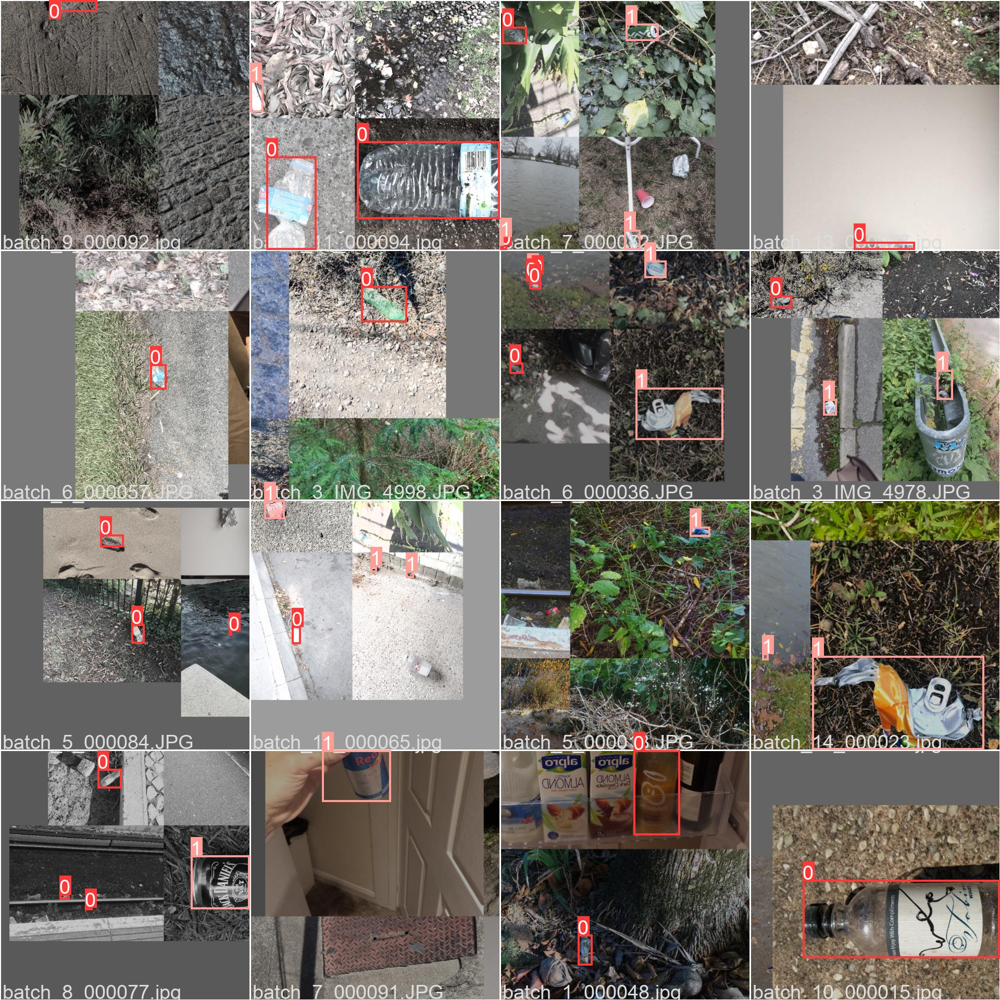

In [27]:
display(Image(filename='runs/train/exp3/train_batch0.jpg', width=768))

#### Результаты обучения модели

Precision

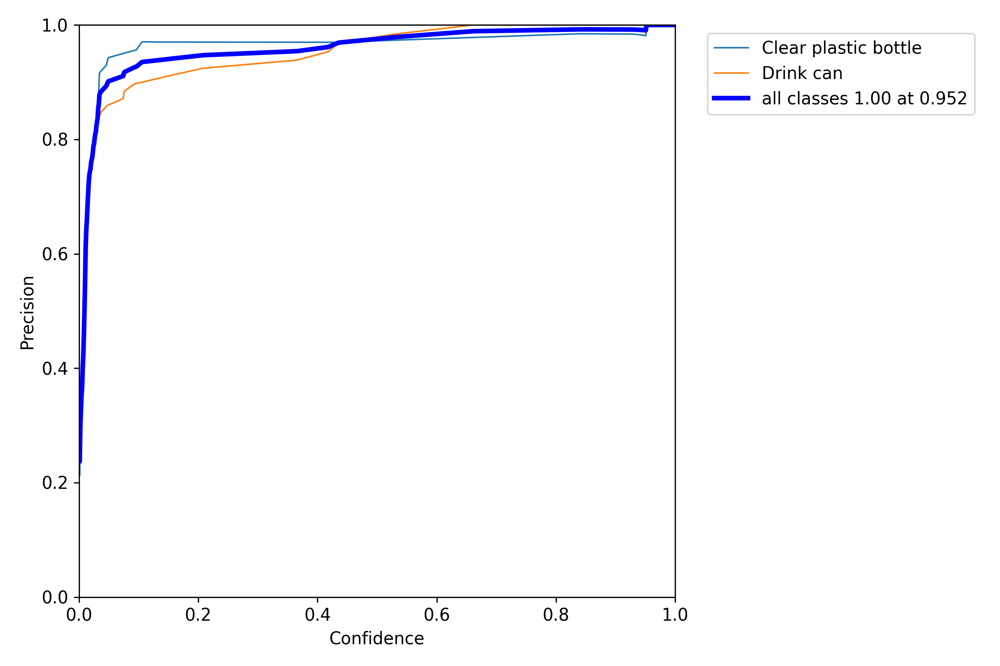

In [28]:
display(Image(filename='runs/train/exp3/P_curve.png', width=640))

Recall

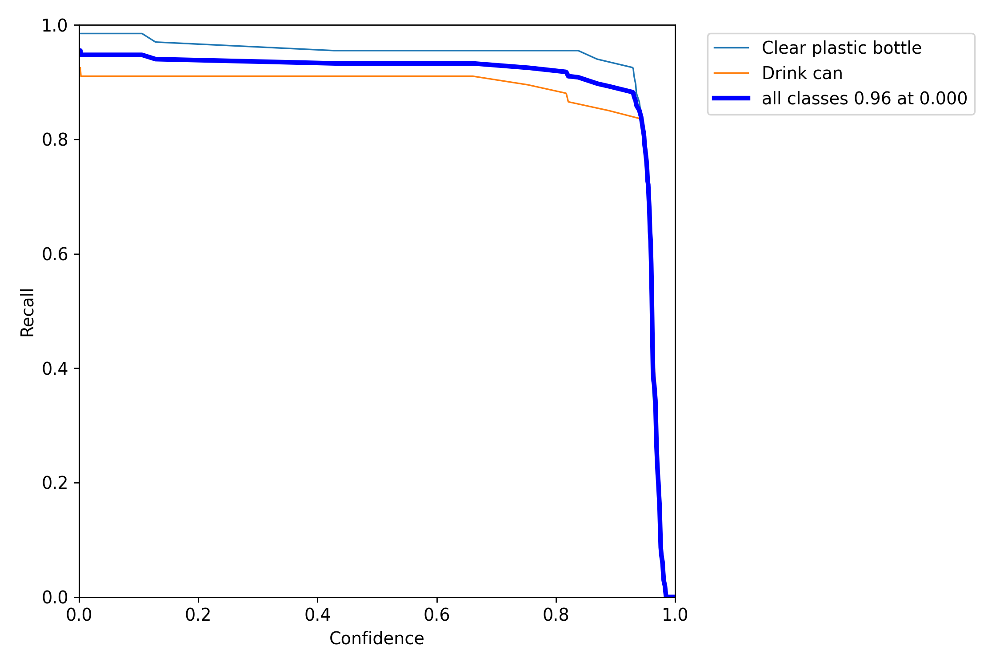

In [29]:
display(Image(filename='runs/train/exp3/R_curve.png', width=640))

Precision-Recall curve

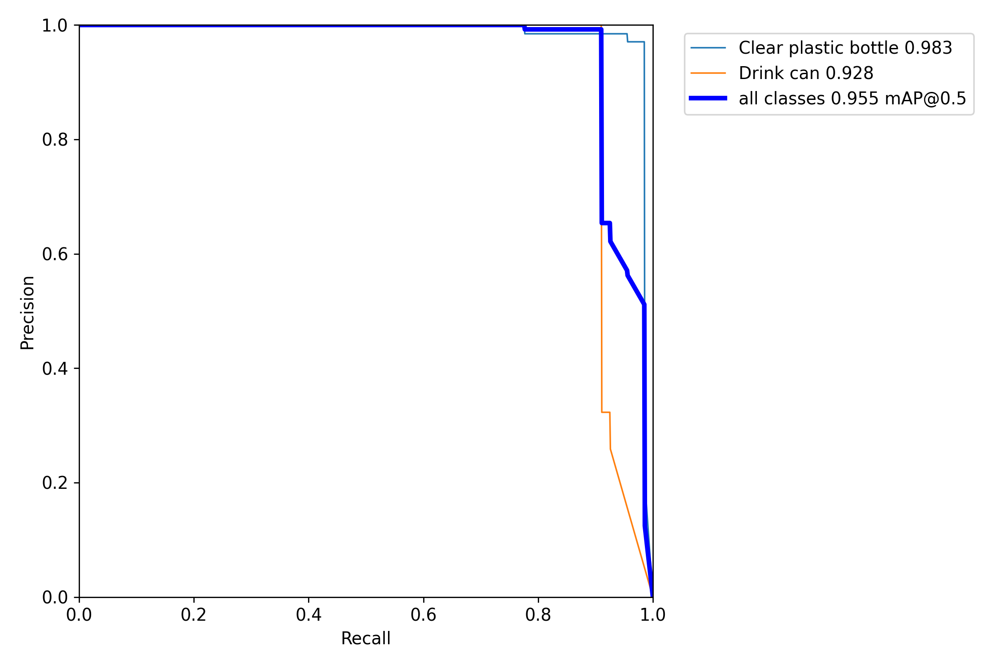

In [30]:
display(Image(filename='runs/train/exp3/PR_curve.png', width=640))

F1-score

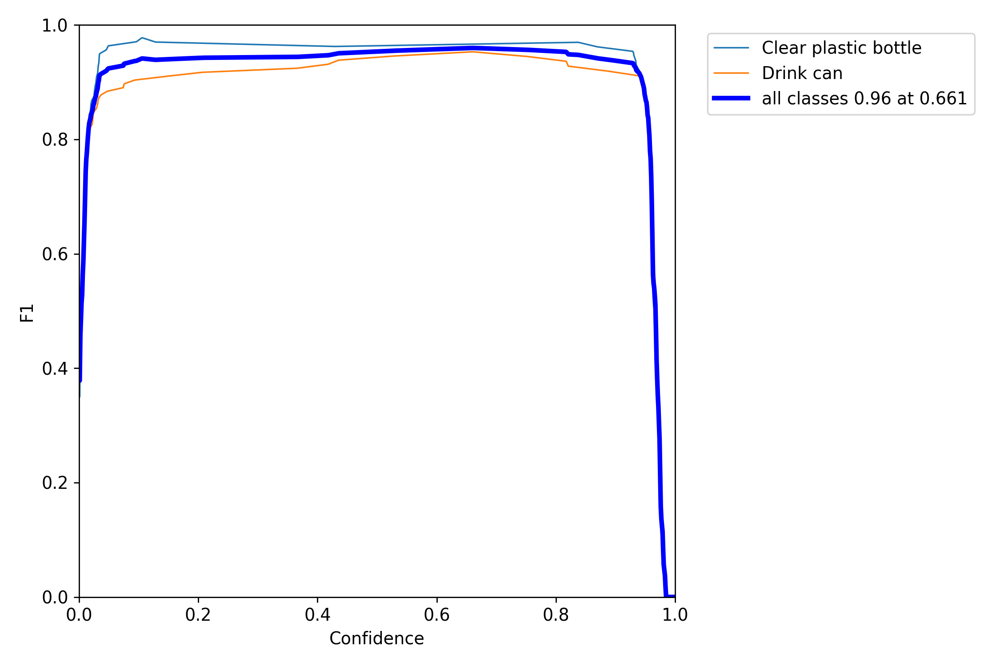

In [31]:
display(Image(filename='runs/train/exp3/F1_curve.png', width=640))

Labels

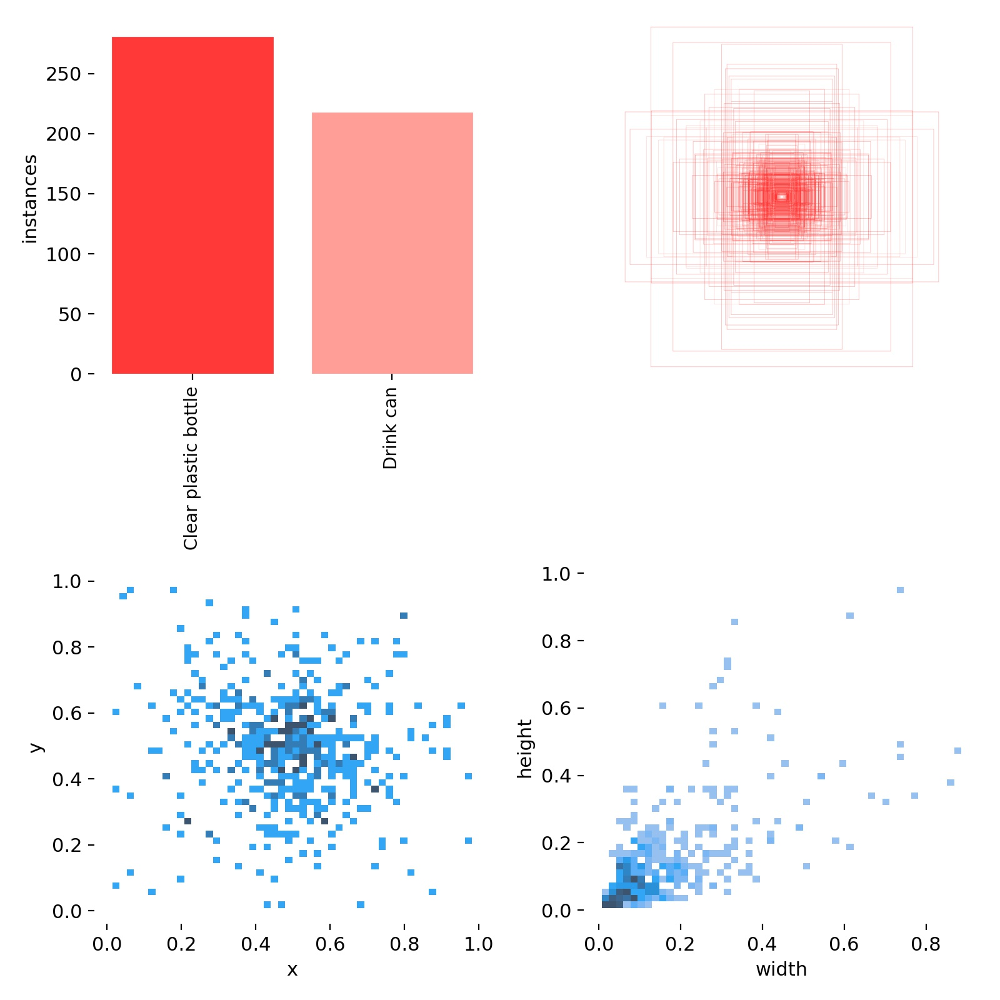

In [32]:
display(Image(filename='runs/train/exp3/labels.jpg', width=640))

#### Вывод по результатам обучения модели:
* обучение на NVIDIA A100 (80Gb) заняло 2 часа
* на валидационной выборке изображений получены следующие значения метрик оценки качества по 2 классам:
    * Precision: 0.989
    * Recall: 0.933
    * mAP 0.5: 0.955

                   Class     Images     Labels          P          R     mAP@.5 mAP@
                     all         73        134      0.989      0.933      0.955      0.924
    Clear plastic bottle         73         67      0.978      0.955      0.983      0.947
    Drink can         73         67          1       0.91      0.928      0.901

<a id="test"></a>
## Оценка модели на тестовой выборке

In [33]:
!python val.py --data ../taco2_test.yaml --weights ./runs/train/exp3/weights/best.pt --img {IMG_SIZE}

val: data=../taco2_test.yaml, weights=['./runs/train/exp3/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.0-253-ga45e472 torch 1.10.1 CUDA:0 (A100-SXM-80GB, 81251MiB)

Fusing layers... 
Model Summary: 213 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning '/home/sergzemsk/dls/yolov5/taco/test/labels.cache' images and lab
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         36         49       0.98      0.888      0.921      0.859
Clear plastic bottle         36         30       0.96      0.933      0.943      0.918
           Drink can         36         19          1      0.842      0.898        0.8
Speed: 0.4ms pre-process, 1.8ms inference, 0.8ms NMS per image a

На валидационной выборке изображений получены следующие значения метрик оценки качества по 2 классам:

* Precision: **0.98**
* Recall: **0.888**
* mAP 0.5: **0.921**

#### Просмотр детектирования мусора на тестовой выборке изображений

Confidental выбран по результатам анализа тренировки модели

In [38]:
!python detect.py --weights runs/train/exp3/weights/best.pt --img {IMG_SIZE} --conf 0.6 --source taco/test/images

detect: weights=['runs/train/exp3/weights/best.pt'], source=taco/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.6, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-253-ga45e472 torch 1.10.1 CUDA:0 (A100-SXM-80GB, 81251MiB)

Fusing layers... 
Model Summary: 213 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/36 /home/sergzemsk/dls/yolov5/taco/test/images/batch_10_000035.jpg: 640x320 Done. (0.013s)
image 2/36 /home/sergzemsk/dls/yolov5/taco/test/images/batch_10_000081.jpg: 320x640 1 Clear plastic bottle, Done. (0.014s)
image 3/36 /home/sergzemsk/dls/yolov5/taco/test/images/batch_10_000087.jpg: 640x320 1 Clear plastic bottle, Done. (0.011s)
image 4/36 /home/sergzemsk/dls/yo

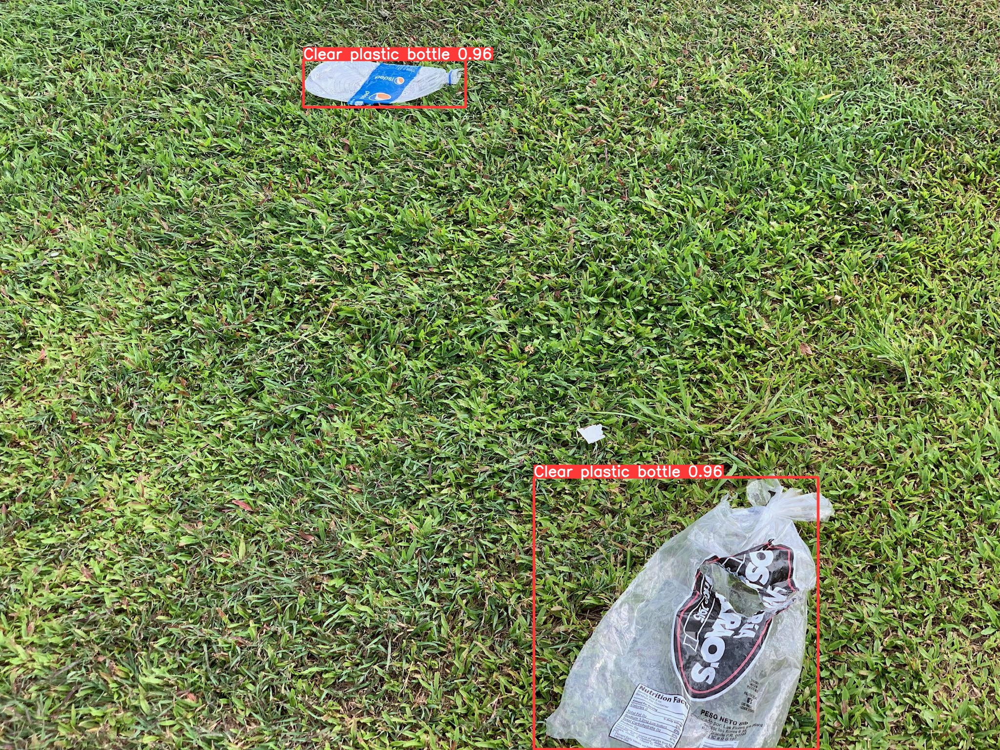

In [39]:
display(Image('runs/detect/exp5/batch_15_000062.jpg', width=480))

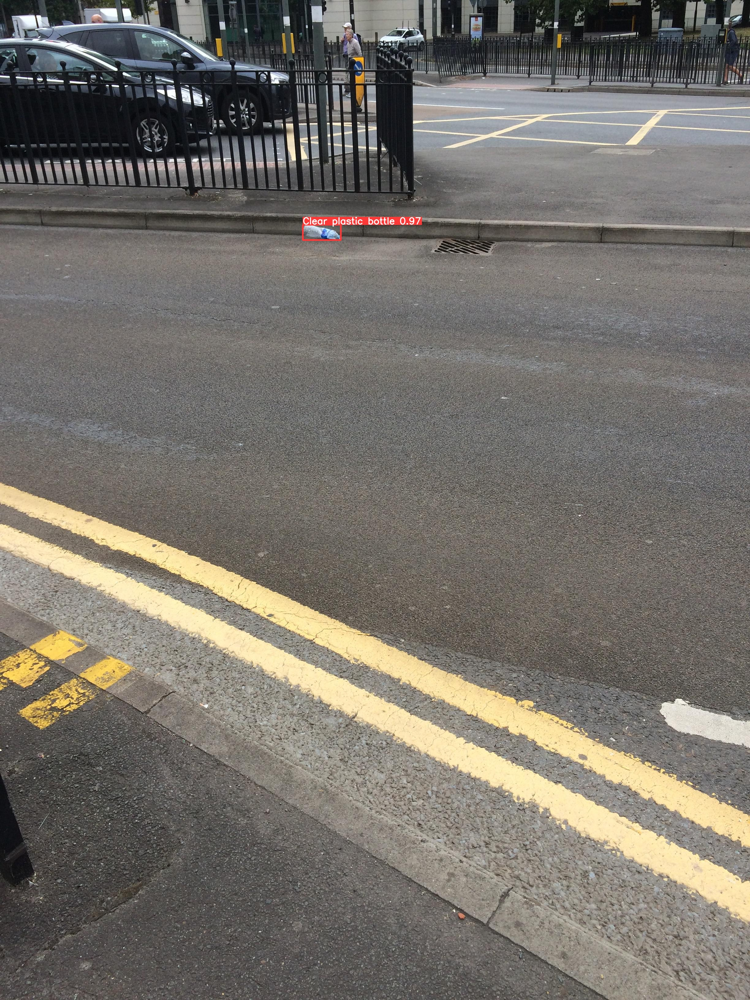

In [40]:
display(Image('runs/detect/exp5/batch_2_000018.JPG', width=480))

Для просмотра всей тестовой выборки раскомментировать код ниже (закомментирован для уменьшения размера notebook)

In [26]:
# for imageName in glob.glob('runs/detect/exp/*.JPG'):
#     print(f"{imageName}:")
#     display(Image(filename=imageName, width=320))
#     print("\n")

<a id="conclusion"></a>
## Вывод

* обучена модель YOLOv5 (yolov5s) на датасете с фотографиями мусора по двумя категориям объектов:
    * Clear plastic bottles
    * Drink can
* получение метрики оценки качества модели позволяют использовать модель на произвольных фотографиях